In [ ]:
from google.colab import files
files.upload()

Saving model to model


{'model': b'PK\x03\x04\x00\x00\x08\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x12\x00archive/data.pklFB\x0e\x00ZZZZZZZZZZZZZZ\x80\x02ccollections\nOrderedDict\nq\x00)Rq\x01(X\x11\x00\x00\x00backbone.0.weightq\x02ctorch._utils\n_rebuild_tensor_v2\nq\x03((X\x07\x00\x00\x00storageq\x04ctorch\nFloatStorage\nq\x05X\x01\x00\x00\x000q\x06X\x03\x00\x00\x00cpuq\x07M\x00\x18tq\x08QK\x00K K@K\x03\x87q\tK\xc0K\x03K\x01\x87q\n\x89h\x00)Rq\x0btq\x0cRq\rX\x0f\x00\x00\x00backbone.0.biasq\x0eh\x03((h\x04h\x05X\x01\x00\x00\x001q\x0fh\x07K tq\x10QK\x00K \x85q\x11K\x01\x85q\x12\x89h\x00)Rq\x13tq\x14Rq\x15X\x11\x00\x00\x00backbone.1.weightq\x16h\x03((h\x04h\x05X\x01\x00\x00\x002q\x17h\x07K tq\x18QK\x00K \x85q\x19K\x01\x85q\x1a\x89h\x00)Rq\x1btq\x1cRq\x1dX\x0f\x00\x00\x00backbone.1.biasq\x1eh\x03((h\x04h\x05X\x01\x00\x00\x003q\x1fh\x07K tq QK\x00K \x85q!K\x01\x85q"\x89h\x00)Rq#tq$Rq%X\x17\x00\x00\x00backbone.1.running_meanq&h\x03((h\x04h\x05X\x01\x00\x00\x004q\'h\x07

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
import torch
import torch.nn as nn
import torchvision
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import numpy as np
import pathlib

from PIL import Image
import matplotlib.pyplot as plt

# some preprocessing techniques
from scipy.fftpack import dct
import cv2

In [ ]:
class Frequent_Domain_Subnetwork(nn.Module):
    def __init__(self):
        super(Frequent_Domain_Subnetwork, self).__init__()
        self.backbone = nn.Sequential(nn.Conv1d(64, 32, 3, padding=1),
                             nn.BatchNorm1d(32),
                             nn.ReLU(),
                             nn.MaxPool1d(2),
                             nn.Conv1d(32, 64, 3, padding=1),
                             nn.BatchNorm1d(64),
                             nn.ReLU(),
                             nn.MaxPool1d(2),
                             nn.Conv1d(64, 128, 3, padding=1),
                             nn.BatchNorm1d(128),
                             nn.ReLU(),
                             nn.MaxPool1d(2),
                             nn.Flatten(),
                             nn.Linear(4096, 64),
                             nn.ReLU(),
                             nn.Linear(64, 64))
        #self.Wc = nn.Linear(64, 2)

    def forward(self, x):
        out = self.backbone.forward(x)
        return out


In [ ]:
device = 'cpu'
model = Frequent_Domain_Subnetwork().to(device)

In [ ]:
model.load_state_dict(torch.load("model"))

<All keys matched successfully>

In [ ]:
class DCT(object):
    def __init__(self):
        self.BLOCK_HEIGHT = 8
        self.BLOCK_WIDTH = 8
        self.BLOCK_SIZE = (self.BLOCK_HEIGHT, self.BLOCK_WIDTH)

    def div_block(self, img, block_size):
        img_height = img.height
        img_width = img.width
        block_height = block_size[0]
        block_width = block_size[1]
        assert(img_height % block_height == 0)
        assert(img_width % block_width == 0)

        blocks = []
        for i in range(0,img_height,block_height):
            for j in range(0,img_width,block_width):
                box = (j, i, j+block_width, i+block_height)
                block = np.array(img.crop(box))
                blocks.append(block)
        return np.array(blocks)

    def dct2(self, array_2d):
        return dct(dct(array_2d.T, norm = 'ortho').T, norm = 'ortho')

    def _dct2(self, array_2d):
        return dct(dct(array_2d, norm = 'ortho').T, norm = 'ortho').T

    def __call__(self, img):
        image = img
        blocks = self.div_block(image, self.BLOCK_SIZE)
        b_blocks, g_blocks, r_blocks = blocks[:, :, :, 0], blocks[:, :, :, 1], blocks[:, :, :, 2]
        test_blocks = (b_blocks + g_blocks + r_blocks) / 3 # naive greyscale
        result = np.array([self._dct2(test_block) for test_block in test_blocks])
        # return a torch.tensor
        return torch.from_numpy(result.reshape(256, 64).T).float()

    def __repr__(self):
        return "Simply DCT. What do you expect?"

'''
Usage: Same as DCT()

input: 64*256 torch array (histogram)
output: 64*256 torch array (frequency histogram)
'''
class DFT(object):
    def __init__(self):
        pass

    def __call__(self, freq):
        # convert into complex form containing real and imaginary part
        cmplx = torch.from_numpy(np.zeros((freq.shape[0], freq.shape[1], 2)))
        cmplx[:, :, 0] += freq
        out = torch.fft(cmplx, 1)[:, :, 0]
        return out

    def __repr__(self):
        return "Simply DFT. What do you expect?"

class Ycbcr_convert():
    def __init__(self):
        pass

    def __call__(self, img):
        return img.convert('YCbCr')

    def __repr__(self):
        return "Convert a PIL Image from RGB to YCbCr"

In [ ]:
image_height = 128
image_width  = 128
mytransform = transforms.Compose([
    transforms.Resize((image_height,image_width), interpolation=Image.BICUBIC),
    Ycbcr_convert(),
    DCT(),
    # DFT()
])

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:288: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "


In [ ]:
!pip install ffmpeg

  Created wheel for ffmpeg: filename=ffmpeg-1.4-py3-none-any.whl size=6083 sha256=cf47de3a03f7f91d4ddfde9034b3f430a8602c4f851d76b05a4c0d865c0772ae
  Stored in directory: /root/.cache/pip/wheels/64/80/6e/caa3e16deb0267c3cbfd36862058a724144e19fdb9eb03af0f
Successfully built ffmpeg


In [ ]:
import os
import subprocess

In [ ]:
def split_video(video_file, image_name_prefix, source_path, destination_path):
    return subprocess.check_output('ffmpeg -i "' + source_path + video_file + '" -r 0.33 ' + 
                                   image_name_prefix + '%d.jpg -hide_banner', shell=True, cwd=destination_path)

In [ ]:
#upload video to be predicted
from google.colab import files
files.upload()

Saving 1100072001.avi to 1100072001.avi


{'1100072001.avi': b'RIFF\x14\xaf\x16\x00AVI LISTf\x12\x00\x00hdrlavih8\x00\x00\x005\x82\x00\x00$\xea\x01\x00\x00\x00\x00\x00\x10\t\x00\x00,\x01\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x10\x00\x80\x02\x00\x00\xe0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00LIST\x0e\x11\x00\x00strlstrh8\x00\x00\x00vidsXVID\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00,\x01\x00\x00\x9a\\\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x80\x02\xe0\x01strfV\x00\x00\x00U\x00\x00\x00\x80\x02\x00\x00\xe0\x01\x00\x00\x01\x00\x18\x00XVID\x00\x10\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\xb0\x01\x00\x00\x01\xb5\x89\x13\x00\x00\x01\x00\x00\x00\x01 \x00\xc4\x8d\x88\x00\xf5\x14\x04<\x14c\x00\x00\x01\xb2Lavc54.35.0\x00JUNK\x18\x10\x00\x00\x04\x00\x00\x00\x00\x00\x00\x0000dc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00

In [ ]:
#video preview
from moviepy.editor import *
path="1100072001.avi"
clip=VideoFileClip(path)
clip.ipython_display(width=350)

100%|█████████▉| 300/301 [00:01<00:00, 231.08it/s]


In [ ]:
!ffmpeg -i 1100072001.avi output.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [ ]:
split_video('1100072001.avi','frame','/content/','/content/drive/MyDrive/to_predict/pred/')
print('Frames extracted')

Frames extracted


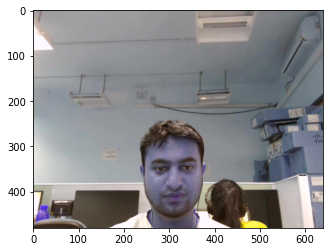

In [ ]:
#frame preview
img=cv2.imread('/content/drive/MyDrive/to_predict/pred/frame4.jpg')
plt.imshow(img)

In [ ]:
pred_path='/content/drive/MyDrive/to_predict/pred/'
path=os.listdir('/content/drive/MyDrive/to_predict/pred/')
arr=[]
for i in path:
    print(i)
    img = cv2.imread(pred_path+i)
    color_coverted = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    pil_img = Image.fromarray(color_coverted)
    img=mytransform(pil_img)
    arr.append(img)
  

ten=torch.stack(arr)
print(ten)


frame1.jpg
frame2.jpg
frame3.jpg
frame4.jpg
frame5.jpg
tensor([[[ 4.2762e+02,  4.2400e+02,  4.2362e+02,  ...,  1.9854e+02,
           5.1125e+02,  4.9342e+02],
         [ 2.8729e+00,  2.7568e+00,  1.5712e-01,  ..., -1.3578e+02,
          -1.4878e+01,  1.1458e+02],
         [ 1.1563e+01, -6.2139e-01,  2.0842e-01,  ...,  8.6505e+01,
           6.2290e+00,  1.9774e+01],
         ...,
         [ 4.7327e-02,  3.8481e-02, -6.2580e-02,  ..., -8.0728e-01,
          -2.7576e-01,  1.8479e-02],
         [ 7.4031e-02,  1.2873e-03,  5.6019e-02,  ...,  1.2842e-01,
           6.3869e-02, -7.6755e-02],
         [ 1.4112e-01,  9.7208e-02,  5.6173e-02,  ..., -4.8748e-01,
           5.1392e-02,  1.5126e-01]],

        [[ 4.2688e+02,  4.2400e+02,  4.2379e+02,  ...,  1.9862e+02,
           5.1125e+02,  4.9262e+02],
         [ 3.4938e+00,  2.4152e+00,  2.6858e-01,  ..., -1.3607e+02,
          -1.4206e+01,  1.1471e+02],
         [ 1.2145e+01, -4.0363e-01, -7.3121e-02,  ...,  8.6550e+01,
           6.3511e+00

In [ ]:
print(ten.shape)

torch.Size([5, 64, 256])


In [ ]:
def prediction(pred):
    b=pred.count(0)
    c=pred.count(1)
    e=pred.count(2)
    f=pred.count(3)
    if(max(b,c,e,f)>=3):
      if(b>=3):
        print('Boredom')
      elif(c>=3):
        print('Confused')
      elif(e>=3):
        print('Engaged')
      elif(f>=3):
        print('Frustrated')
    
    

In [ ]:
out=model(ten)
pred = torch.argmax(out, dim=1)
pred=pred.tolist()
print(pred)
prediction(pred)

[2, 2, 0, 2, 2]
Engaged
